<a href="https://colab.research.google.com/github/siddhiagarwal029/satellite_img_analysis/blob/main/Sundarbans_Satellite_Imagery_Analysis_using_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# <font color = 'tomato'>Sundarbans Satellite Imagery Analysis using Python</font>

#Import Modules

In [ ]:
!pip install earthpy gdal

In [ ]:
from glob import glob     #'''This function returns a list of path names that match a specified pattern.'''

import earthpy as et
import earthpy.spatial as es      #''' This submodule contains functions for spatial data processing, such as clipping, reprojecting, and stacking rasters.'''
import earthpy.plot as ep        # '''This submodule contains functions for plotting spatial data using matplotlib.'''

import rasterio as rio    #'''This library provides functions for reading, writing, and processing raster datasets.'''
from rasterio.plot import plotting_extent
from rasterio.plot import show
from rasterio.plot import reshape_as_raster, reshape_as_image

import matplotlib.pyplot as plt #''''This module provides a MATLAB-like plotting framework.'''
import numpy as np   #''' This library provides support for numerical operations in Python.'''
from matplotlib.colors import ListedColormap    #'''This class creates a colormap from a list of colors.'''

from scipy.io import loadmat
from sklearn.metrics import classification_report, accuracy_score

import plotly.graph_objects as go    #'''This module provides an interface to generate interactive plots using Plotly.'''

np.seterr(divide='ignore', invalid='ignore')

{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'ignore'}

In [ ]:
%cd Data/sundarbans_data


[Errno 2] No such file or directory: 'Data/sundarbans_data'
/content


## Sentine 2 Band Details

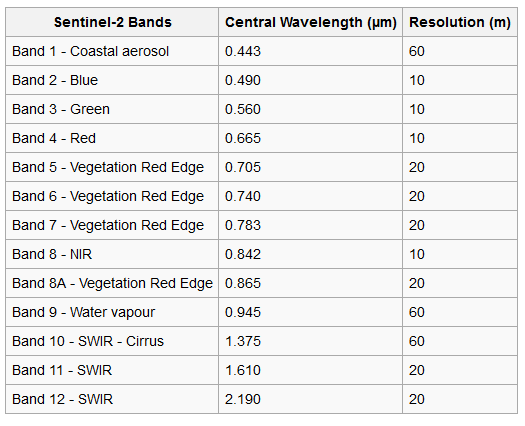

# DataSet

## Sundarbans Satellite Data

In [ ]:
S_sentinel_bands = glob("/content/drive/MyDrive/sundarbans_data/*B?*.tiff")
S_sentinel_bands.sort()
S_sentinel_bands

['/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B01_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B02_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B03_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B04_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B05_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B06_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B07_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B08_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_data/2020-01-27-00_00_2020-01-27-23_59_Sentinel-2_L2A_B09_(Raw).tiff',
 '/content/drive/MyDrive/sundarbans_d

In [ ]:
l = []
for i in S_sentinel_bands:
  with rio.open(i, 'r') as f:
    l.append(f.read(1))


In [ ]:
arr_st = np.stack(l)

In [ ]:
arr_st.shape

(12, 954, 298)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


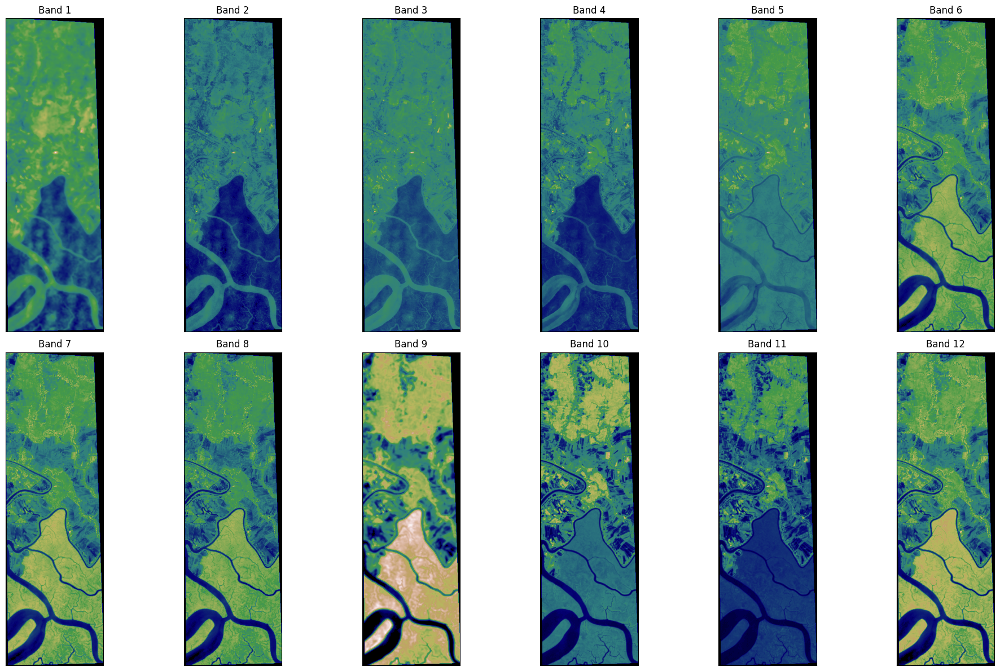

In [ ]:
ep.plot_bands(arr_st, cmap = 'gist_earth', figsize = (20, 12), cols = 6, cbar = False)
plt.show()

ep.plot_bands(): This function is used to plot multiple bands of a raster dataset stacked in a NumPy array. It is part of the earthpy.plot module.

arr_st: This is the input multi-band raster data stored in a NumPy array. It represents the different bands of the Sentinel satellite images stacked together.
cmap='gist_earth': This specifies the colormap to be used for visualizing the raster data. In this case, 'gist_earth' is used, which is a colormap resembling natural earth tones.
figsize=(20, 12): This specifies the size of the figure (plot) in inches. The figure will have a width of 20 inches and a height of 12 inches.
cols=6: This specifies the number of columns to arrange the subplots in the plot. In this case, the subplots (bands) will be arranged in 6 columns.
cbar=False: This specifies whether to include a colorbar in the plot. Here, False indicates that the colorbar should not be included.
plt.show(): This function displays the plot on the screen. It is a standard Matplotlib function used to show plots.

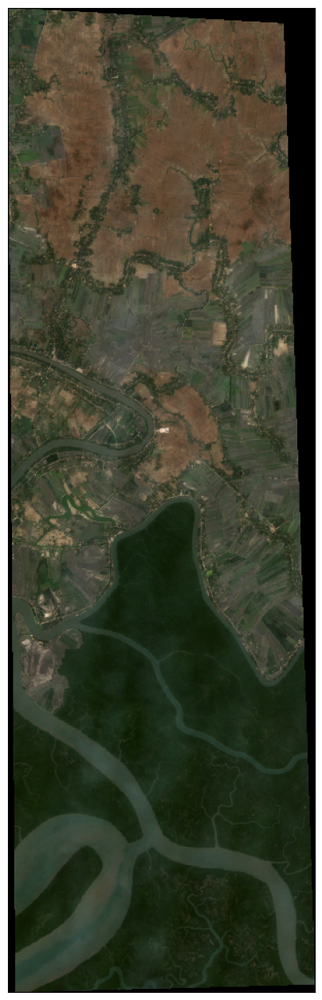

In [ ]:
rgb = ep.plot_rgb(arr_st,
                  rgb=(3,2,1),
                  figsize=(10, 16),
                  # title='RGB Composite Image'
                  )

plt.show()

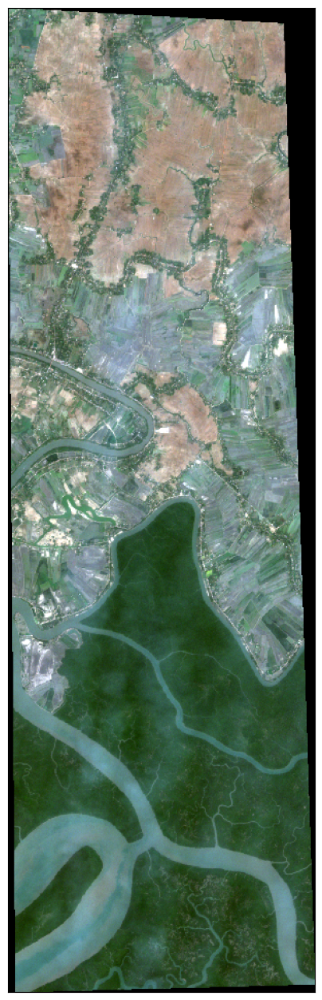

In [ ]:
ep.plot_rgb(
    arr_st,
    rgb=(3, 2, 1),
    stretch=True,
    str_clip=0.2,
    figsize=(10, 16),
    # title="RGB Composite Image with Stretch Applied",
)

plt.show()

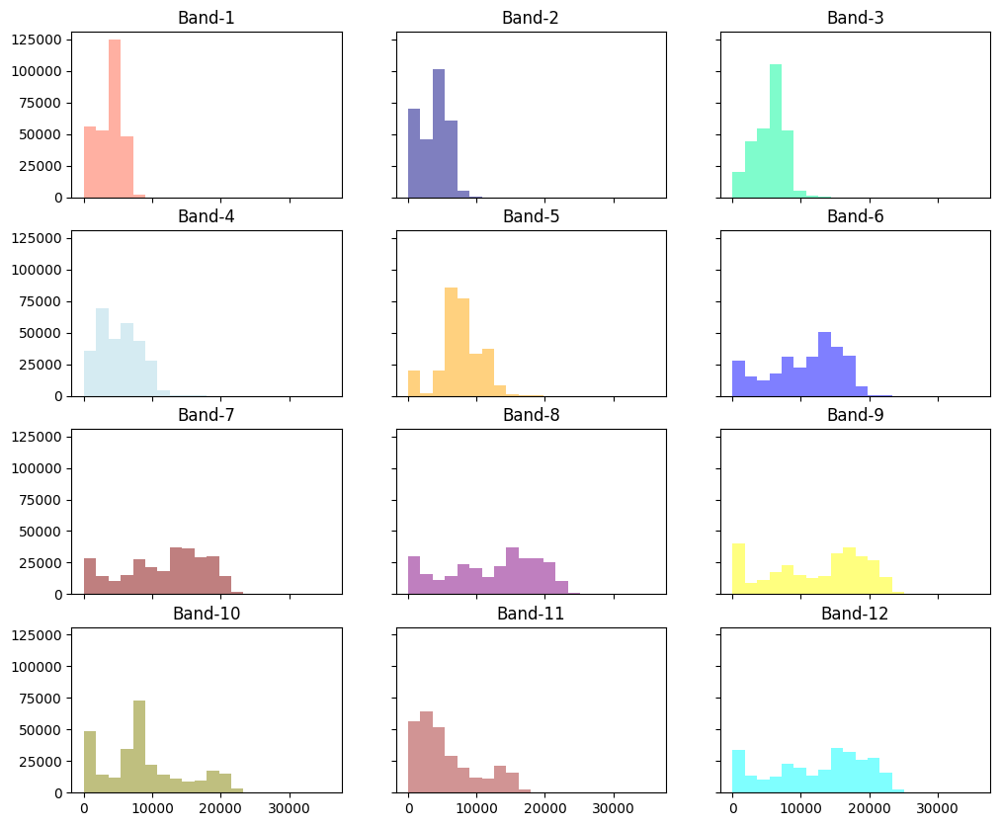

In [ ]:
colors = ['tomato', 'navy', 'MediumSpringGreen', 'lightblue', 'orange', 'blue',
          'maroon', 'purple', 'yellow', 'olive', 'brown', 'cyan']

ep.hist(arr_st,      #''' This function is used to plot histograms of each band of a multi-band raster dataset. It is part of the earthpy.plot module.'''
         colors = colors,
        title=[f'Band-{i}' for i in range(1, 13)],   #'''This specifies the titles for each histogram. In this case, titles will be generated for bands numbered from 1 to 12.'''
        cols=3,  #'''This specifies the number of columns to arrange the histograms in the plot. In this case, the histograms will be arranged in 3 columns.'''
        alpha=0.5,  #'''This parameter controls the transparency of the histograms. Here, 0.5 indicates 50% transparency, making the histograms slightly transparent.'''
        figsize = (12, 10)  #''' This specifies the size of the figure (plot) in inches. The figure will have a width of 12 inches and a height of 10 inches.'''
        )

plt.show()

In [ ]:
x = np.moveaxis(arr_st, 0, -1)
x.shape

(954, 298, 12)

In [ ]:
from sklearn.preprocessing import StandardScaler

X_data = x.reshape(-1, 12)

scaler = StandardScaler().fit(X_data)

X_scaled = scaler.transform(X_data)

X_scaled.shape

(284292, 12)

In [ ]:
y_data = loadmat('Sundarbands_gt.mat')['gt']
y_data.shape

(954, 298)

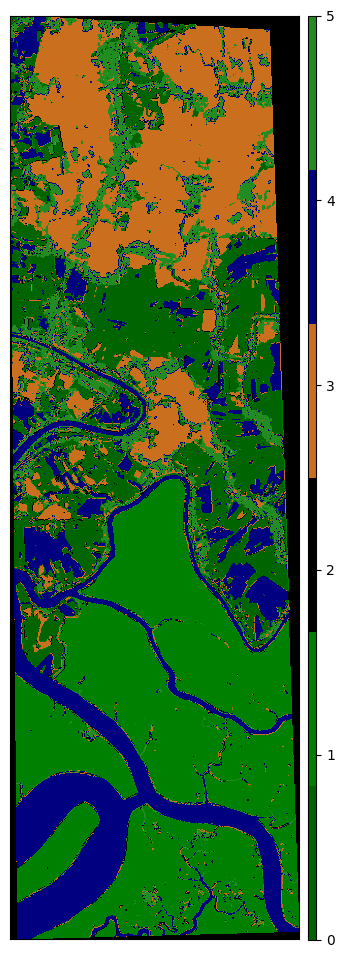

In [ ]:
# Visualize Groundtruth

ep.plot_bands(y_data, cmap=ListedColormap(['darkgreen', 'green', 'black', '#CA6F1E', 'navy', 'forestgreen']))
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_data.ravel(), test_size=0.30, stratify = y_data.ravel())

print(f'X_train Shape: {X_train.shape}\nX_test Shape: {X_test.shape}\ny_train Shape: {y_train.shape}\ny_test Shape:{y_test.shape}')


X_train Shape: (199004, 12)
X_test Shape: (85288, 12)
y_train Shape: (199004,)
y_test Shape:(85288,)


In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=6)
knn.fit(X_train, y_train)

knn_pred = knn.predict(X_test)

In [ ]:
print(f"Accuracy: {accuracy_score(y_test, knn_pred)*100}")

Accuracy: 98.9494418910046


In [ ]:
print(classification_report(y_test, knn_pred))


              precision    recall  f1-score   support

           0       0.97      0.99      0.98     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       0.99      0.99      0.99     16790
           4       0.99      0.99      0.99     13545
           5       0.98      0.95      0.97      9066

    accuracy                           0.99     85288
   macro avg       0.99      0.99      0.99     85288
weighted avg       0.99      0.99      0.99     85288



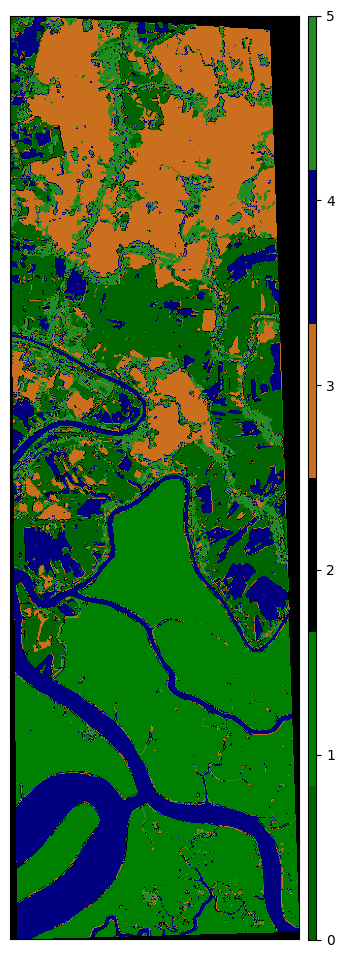

In [ ]:
# Visualize Classification Map of K-NNC

ep.plot_bands(knn.predict(X_scaled).reshape((954, 298)),
              cmap=ListedColormap(['darkgreen', 'green', 'black',
                                   '#CA6F1E', 'navy', 'forestgreen']))
plt.show()

In [ ]:
from sklearn.svm import SVC

svm = SVC(C=3.0, kernel='rbf', degree=6, cache_size=1024)
svm.fit(X_train, y_train)

SVC(C=3.0, cache_size=1024, degree=6)

In [ ]:
svm_pred = svm.predict(X_test)

In [ ]:
print(f"Accuracy: {accuracy_score(y_test, svm_pred)*100}")

Accuracy: 99.89447518994466


In [ ]:
print(classification_report(y_test, svm_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     16222
           1       1.00      1.00      1.00     23570
           2       1.00      1.00      1.00      6095
           3       1.00      1.00      1.00     16790
           4       1.00      1.00      1.00     13545
           5       1.00      1.00      1.00      9066

    accuracy                           1.00     85288
   macro avg       1.00      1.00      1.00     85288
weighted avg       1.00      1.00      1.00     85288



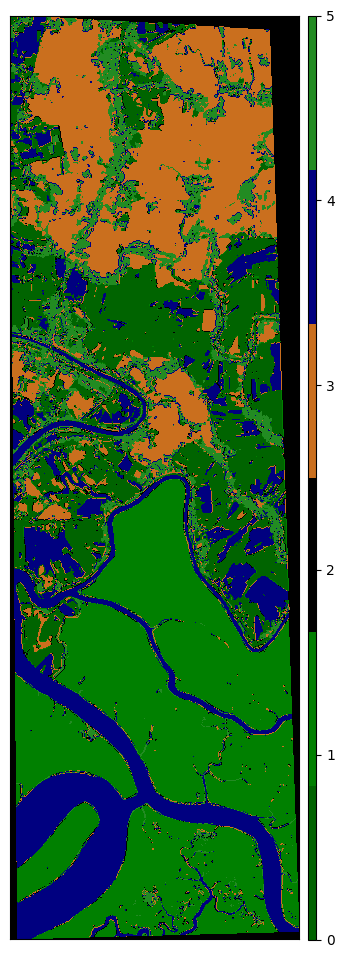

In [ ]:
# Visualize Classification Map of SVM

ep.plot_bands(svm.predict(X_scaled).reshape((954, 298)),
              cmap=ListedColormap(['darkgreen', 'green', 'black',
                                   '#CA6F1E', 'navy', 'forestgreen']))
plt.show()

# Vegetation and soils indices

## Normalized Difference Vegetation Index (NDVI)
```
NDVI = ((NIR - Red)/(NIR + Red))
```

* NIR = pixel values from the near-infrared band
* Red = pixel values from the red band

Researchers must observe the distinct colors (wavelengths) of visible(VIS) and near-infrared (NIR)sunlight reflected by the plants. The Normalized Difference Vegetation Index (NDVI) quantifies vegetation by measuring the difference between near-infrared which vegetation strongly reflects and red light (which vegetation absorbs). NDVI always ranges from -1 to +1.

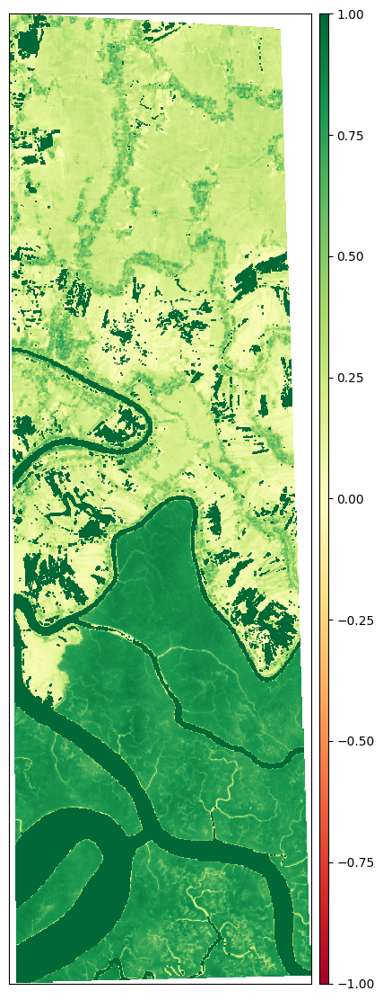

In [ ]:
ndvi = es.normalized_diff(arr_st[7], arr_st[3])

ep.plot_bands(ndvi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Soil-Adjusted Vegetation Index (SAVI)

```
SAVI = ((NIR - Red) / (NIR + Red + L)) x (1 + L)
```
* NIR = pixel values from the near infrared band
* Red = pixel values from the near red band
* L = amount of green vegetation cover

In [ ]:
L = 0.5

savi = ((arr_st[7] - arr_st[3]) / (arr_st[7] + arr_st[3] + L)) * (1 + L)

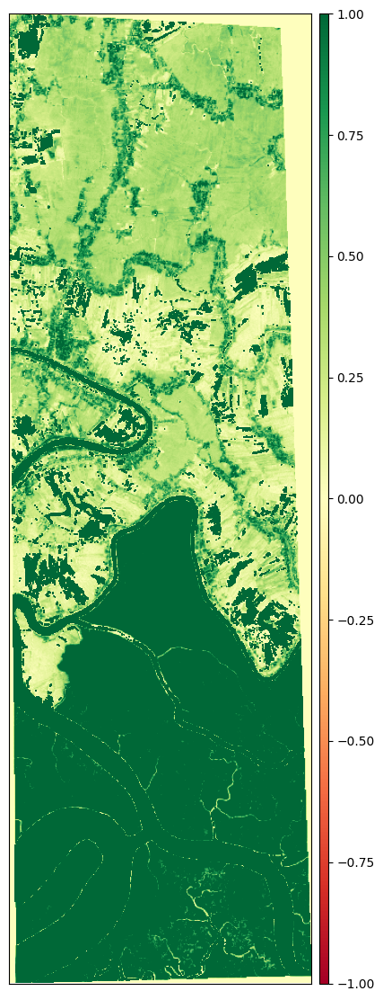

In [ ]:
ep.plot_bands(savi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Visible Atmospherically Resistant Index (VARI)
```
VARI = (Green - Red)/ (Green + Red - Blue)
```
* Green = pixel values from the green band
* Red= pixel values from the red band
* Blue = pixel values from the blue band

In [ ]:
vari = (arr_st[2] - arr_st[3])/ (arr_st[2] + arr_st[3] - arr_st[1])

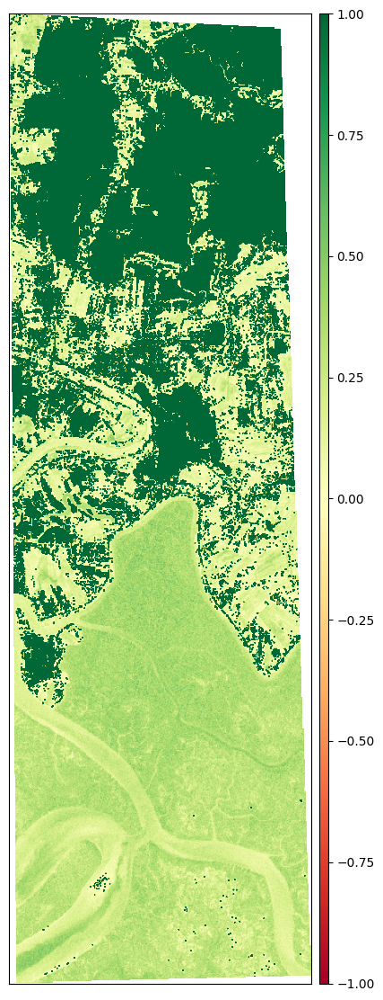

In [ ]:
ep.plot_bands(vari, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Distribution of NDVI, SAVI, and VARI pixel values

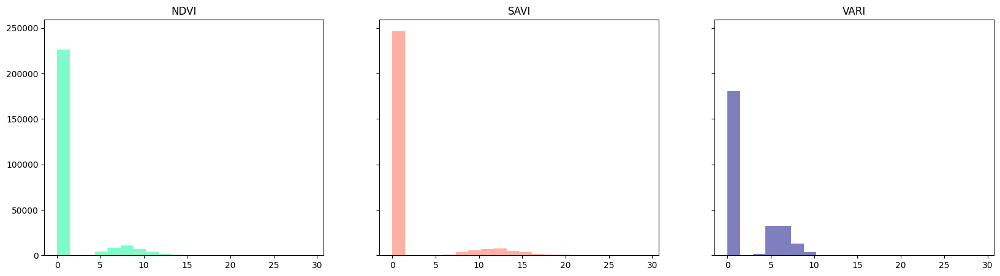

In [ ]:
ep.hist(np.stack([ndvi, savi, vari]),
        alpha=0.5,
        cols=3,
        figsize=(20, 5),
        title = ['NDVI', 'SAVI', 'VARI'],
        colors = ['mediumspringgreen', 'tomato', 'navy'])
plt.show()

# Water Indices

## Modified Normalized Difference Water Index (MNDWI)

```
MNDWI = (Green - SWIR) / (Green + SWIR)
```
* Green = pixel values from the green band
* SWIR = pixel values from the short-wave infrared band

In [ ]:
mndwi = es.normalized_diff(arr_st[2], arr_st[10])

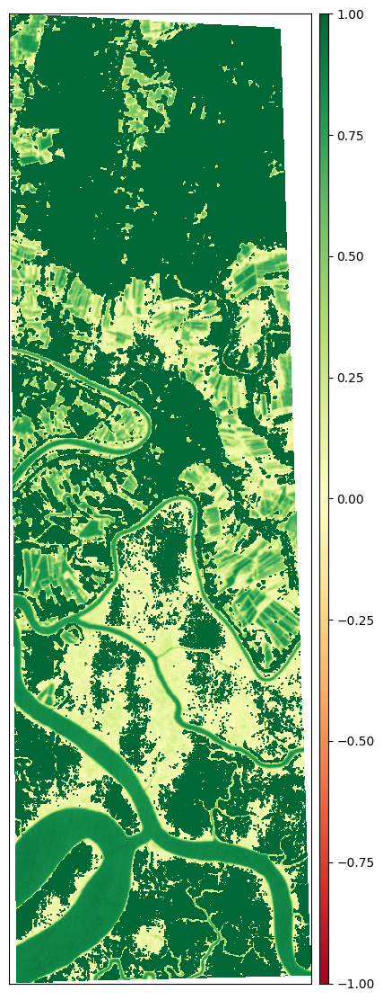

In [ ]:
ep.plot_bands(mndwi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Normalized Difference Moisture Index (NDMI)

```
NDMI = (NIR - SWIR1)/(NIR + SWIR1)
```
* NIR = pixel values from the near infrared band
* SWIR1 = pixel values from the short-wave infrared 1 band

In [ ]:
ndmi = es.normalized_diff(arr_st[7], arr_st[10])

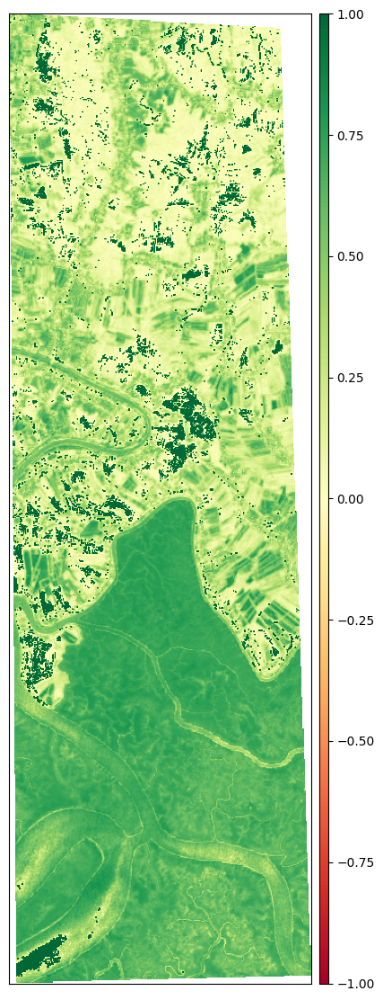

In [ ]:
ep.plot_bands(ndmi, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

# Geology Indices

## Clay Minerals
```
Clay Minerals Ratio = SWIR1 / SWIR2
```
* SWIR1 = pixel values from the short-wave infrared 1 band
* SWIR2 = pixel values from the short-wave infrared 2 band

In [ ]:
cmr = np.divide(arr_st[10], arr_st[11])

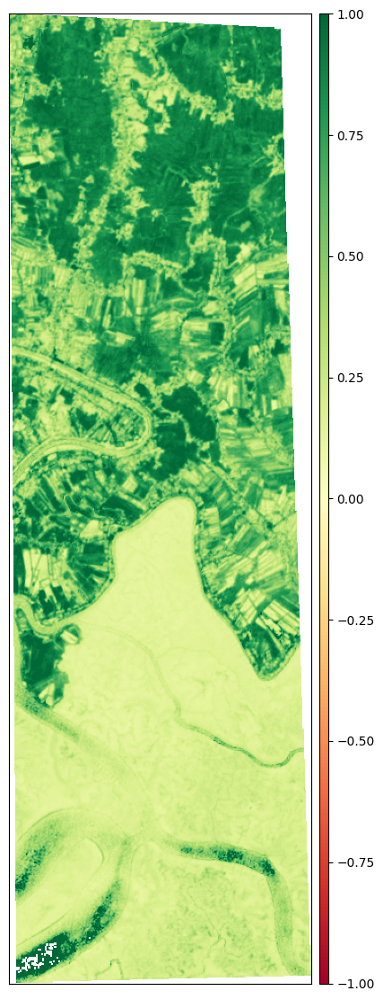

In [ ]:
ep.plot_bands(cmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

## Ferrous Minerals

```
Ferrous Minerals Ratio = SWIR / NIR
```

* SWIR= pixel values from the short-wave infrared band
* NIR = pixel values from the near infrared band

In [ ]:
fmr = np.divide(arr_st[10], arr_st[7])

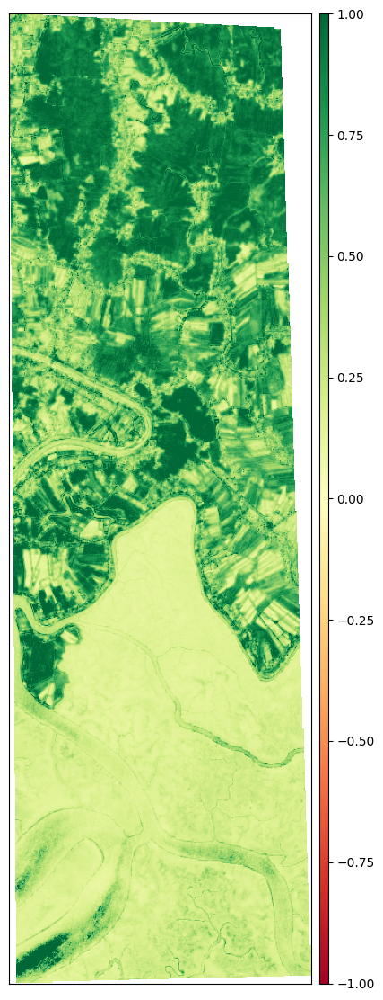

In [ ]:
ep.plot_bands(fmr, cmap="RdYlGn", cols=1, vmin=-1, vmax=1, figsize=(10, 14))

plt.show()

In [ ]:
!pip install jupyter

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 13.5 MB/s eta 0:00:00


In [ ]:
!jupyter nbconvert --to html Sundarbans_Satellite_Imagery_Analysis_using_Python.ipynb

[NbConvertApp] Converting notebook Sundarbans_Satellite_Imagery_Analysis_using_Python.ipynb to html
[NbConvertApp] Writing 10782936 bytes to Sundarbans_Satellite_Imagery_Analysis_using_Python.html
